In [1]:
import pandas as pd
import numpy as np
import plotly.express as px
import folium
import warnings
import utm
warnings.filterwarnings('ignore')

In [2]:
df0 = pd.read_csv("../data/dataset.csv", index_col=0)
df0.head()

,TYPE,YEAR,MONTH,DAY,HOUR,MINUTE,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y
0,Theft from Vehicle,2012,9,28,7,0,X NK_LOC ST,Strathcona,492757.4868,5.458792e+06
1,Break and Enter Commercial,2012,5,9,20,0,6XX ABBOTT ST,Central Business District,492167.2364,5.458548e+06
2,Break and Enter Commercial,2012,2,14,3,33,6XX ABBOTT ST,Central Business District,492167.1811,5.458542e+06
3,Break and Enter Commercial,2012,10,23,3,15,6XX ABBOTT ST,Central Business District,492166.4427,5.458455e+06
4,Break and Enter Commercial,2012,9,24,10,0,6XX ABBOTT ST,Central Business District,492166.4427,5.458455e+06


In [3]:
datetime_series = pd.to_datetime(
    df0[['YEAR', 'MONTH', 'DAY', 'HOUR', 'MINUTE']])
df0['DATA'] = datetime_series

df0.dropna(subset=['NEIGHBOURHOOD', 'HUNDRED_BLOCK', 'X', 'Y'], inplace=True)

In [4]:
df0.head()

,TYPE,YEAR,MONTH,DAY,HOUR,MINUTE,HUNDRED_BLOCK,NEIGHBOURHOOD,X,Y,DATA
0,Theft from Vehicle,2012,9,28,7,0,X NK_LOC ST,Strathcona,492757.4868,5.458792e+06,2012-09-28 07:00:00
1,Break and Enter Commercial,2012,5,9,20,0,6XX ABBOTT ST,Central Business District,492167.2364,5.458548e+06,2012-05-09 20:00:00
2,Break and Enter Commercial,2012,2,14,3,33,6XX ABBOTT ST,Central Business District,492167.1811,5.458542e+06,2012-02-14 03:33:00
3,Break and Enter Commercial,2012,10,23,3,15,6XX ABBOTT ST,Central Business District,492166.4427,5.458455e+06,2012-10-23 03:15:00
4,Break and Enter Commercial,2012,9,24,10,0,6XX ABBOTT ST,Central Business District,492166.4427,5.458455e+06,2012-09-24 10:00:00


In [5]:
df0.describe()

,YEAR,MONTH,DAY,HOUR,MINUTE,X,Y,DATA
count,434346.000000,434346.000000,434346.000000,434346.000000,434346.000000,434346.000000,4.343460e+05,434346
mean,2016.978052,6.583183,15.336810,12.180672,16.633801,448994.857208,4.977631e+06,2017-06-25 16:55:32.500586496
min,2012.000000,1.000000,1.000000,0.000000,0.000000,0.000000,0.000000e+00,2012-01-01 00:00:00
25%,2014.000000,4.000000,8.000000,6.000000,0.000000,490293.995875,5.454512e+06,2014-12-11 22:00:00
50%,2017.000000,7.000000,15.000000,14.000000,9.000000,491633.021900,5.457316e+06,2017-07-19 16:35:00
75%,2019.000000,10.000000,23.000000,18.000000,30.000000,493218.129000,5.458730e+06,2019-11-25 08:02:45
max,2022.000000,12.000000,31.000000,23.000000,59.000000,498306.000000,5.462300e+06,2022-12-31 23:46:00
std,3.020985,3.406061,8.741619,7.444645,18.632098,139347.985364,1.544600e+06,NaN


In [6]:
index = df0[df0.X.isin([0])].index
df0.drop(index=index, inplace = True)

In [7]:
#df = df0.head()

In [8]:
df0['COORD'] = df0[['X', 'Y']].apply(tuple, axis=1)

In [9]:
df0.describe()

,YEAR,MONTH,DAY,HOUR,MINUTE,X,Y,DATA
count,396196.000000,396196.000000,396196.000000,396196.000000,396196.000000,396196.000000,3.961960e+05,396196
mean,2016.966607,6.586778,15.324077,13.353557,18.235482,492228.897437,5.456931e+06,2017-06-21 16:05:49.860927488
min,2012.000000,1.000000,1.000000,0.000000,0.000000,483704.888300,5.449797e+06,2012-01-01 00:00:00
25%,2014.000000,4.000000,8.000000,9.000000,0.000000,490797.659000,5.455898e+06,2014-12-21 00:00:45
50%,2017.000000,7.000000,15.000000,15.000000,15.000000,491827.083000,5.457687e+06,2017-07-16 10:32:00
75%,2019.000000,10.000000,23.000000,19.000000,30.000000,493493.720150,5.458785e+06,2019-11-08 00:00:00
max,2022.000000,12.000000,31.000000,23.000000,59.000000,498306.000000,5.462300e+06,2022-12-31 23:46:00
std,2.996589,3.408287,8.721319,6.715446,18.745012,2554.992998,2.397449e+03,NaN


In [10]:
def UTM2LatLong(x,y):
    return utm.to_latlon(x,y, 10, 'N')

df0['LatLong'] = df0.COORD.apply(lambda coord: UTM2LatLong(coord[0], coord[1]) )

df0['Lat'], df0['Long'] = zip(*df0.LatLong)

df0.drop(['X', 'Y', 'COORD'], axis = 1, inplace = True)


In [21]:
df0.head()

,TYPE,YEAR,MONTH,DAY,HOUR,MINUTE,HUNDRED_BLOCK,NEIGHBOURHOOD,DATA,LatLong,Lat,Long
0,Theft from Vehicle,2012,9,28,7,0,X NK_LOC ST,Strathcona,2012-09-28 07:00:00,"(49.28184299843746, -123.09958228830574)",49.281843,-123.099582
1,Break and Enter Commercial,2012,5,9,20,0,6XX ABBOTT ST,Central Business District,2012-05-09 20:00:00,"(49.27963786416977, -123.10769324600048)",49.279638,-123.107693
2,Break and Enter Commercial,2012,2,14,3,33,6XX ABBOTT ST,Central Business District,2012-02-14 03:33:00,"(49.27957916912466, -123.1076938785196)",49.279579,-123.107694
3,Break and Enter Commercial,2012,10,23,3,15,6XX ABBOTT ST,Central Business District,2012-10-23 03:15:00,"(49.27879657324933, -123.10770232665121)",49.278797,-123.107702
4,Break and Enter Commercial,2012,9,24,10,0,6XX ABBOTT ST,Central Business District,2012-09-24 10:00:00,"(49.27879657324933, -123.10770232665121)",49.278797,-123.107702


In [11]:
df0.TYPE.unique()

array(['Theft from Vehicle', 'Break and Enter Commercial',
       'Break and Enter Residential/Other',
       'Vehicle Collision or Pedestrian Struck (with Injury)',
       'Theft of Bicycle', 'Theft of Vehicle',
       'Vehicle Collision or Pedestrian Struck (with Fatality)',
       'Mischief', 'Other Theft'], dtype=object)

In [23]:
def estacao_do_ano(data):
    import datetime
    month = data.month
    day = data.day
    year = data.year

    if (datetime.date(year, month, day) >= datetime.date(year, 3, 20)) and (datetime.date(year, month, day) < datetime.date(year, 6, 21)):
        return 'Spring'
    elif (datetime.date(year, month, day) >= datetime.date(year, 6, 21)) and (datetime.date(year, month, day) < datetime.date(year, 9, 23)):
        return 'Summer'
    elif (datetime.date(year, month, day) >= datetime.date(year, 9, 23)) and (datetime.date(year, month, day) < datetime.date(year, 12, 21)):
        return 'Autumn'
    else:
        return 'Winter'


# Aplicar a função para criar uma nova coluna 'estacao'
df0['SEASON'] = df0['DATA'].apply(estacao_do_ano)
df0.loc[:, 'DAY'] = 1

In [24]:
df0.drop(['HUNDRED_BLOCK'], axis = 1, inplace=True)

In [25]:
df0.head()

,TYPE,YEAR,MONTH,DAY,HOUR,MINUTE,NEIGHBOURHOOD,DATA,LatLong,Lat,Long,SEASON
0,Theft from Vehicle,2012,9,1,7,0,Strathcona,2012-09-28 07:00:00,"(49.28184299843746, -123.09958228830574)",49.281843,-123.099582,Autumn
1,Break and Enter Commercial,2012,5,1,20,0,Central Business District,2012-05-09 20:00:00,"(49.27963786416977, -123.10769324600048)",49.279638,-123.107693,Spring
2,Break and Enter Commercial,2012,2,1,3,33,Central Business District,2012-02-14 03:33:00,"(49.27957916912466, -123.1076938785196)",49.279579,-123.107694,Winter
3,Break and Enter Commercial,2012,10,1,3,15,Central Business District,2012-10-23 03:15:00,"(49.27879657324933, -123.10770232665121)",49.278797,-123.107702,Autumn
4,Break and Enter Commercial,2012,9,1,10,0,Central Business District,2012-09-24 10:00:00,"(49.27879657324933, -123.10770232665121)",49.278797,-123.107702,Autumn


In [26]:
df0.drop(['DAY', 'HOUR', 'MINUTE', 'DATA', 'LatLong'], axis = 1, inplace = True)

In [27]:
df0.info()

<class 'pandas.core.frame.DataFrame'>
Index: 396196 entries, 0 to 434397
Data columns (total 7 columns):
 #   Column         Non-Null Count   Dtype  
---  ------         --------------   -----  
 0   TYPE           396196 non-null  object 
 1   YEAR           396196 non-null  int64  
 2   MONTH          396196 non-null  int64  
 3   NEIGHBOURHOOD  396196 non-null  object 
 4   Lat            396196 non-null  float64
 5   Long           396196 non-null  float64
 6   SEASON         396196 non-null  object 
dtypes: float64(2), int64(2), object(3)
memory usage: 24.2+ MB


In [28]:
df0.to_csv("dataset_mapa.csv")

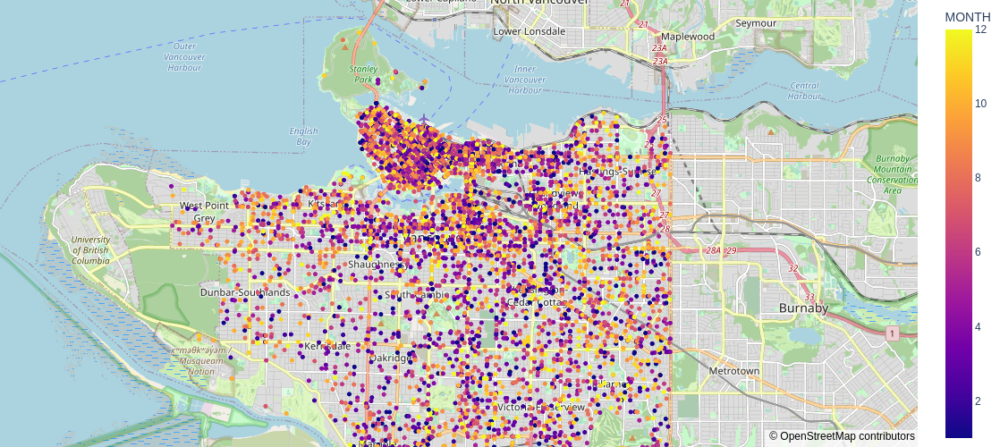

In [21]:
crime = 'Theft from Vehicle'
year = 2022

aux = df0[(df0.TYPE.isin([crime])) & (df0.YEAR.isin([year]))]

fig = px.scatter_mapbox(aux, lat="Lat", lon="Long", hover_name="TYPE", color='MONTH' ,zoom=11, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

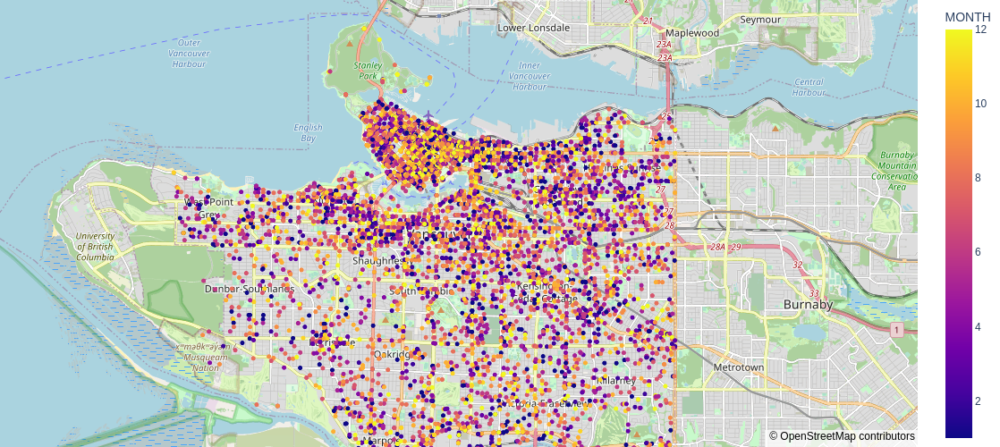

In [20]:
crime = 'Theft from Vehicle'
year = 2021

aux = df0[(df0.TYPE.isin([crime])) & (df0.YEAR.isin([year]))]

fig = px.scatter_mapbox(aux, lat="Lat", lon="Long", hover_name="TYPE", color='MONTH' ,zoom=11, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

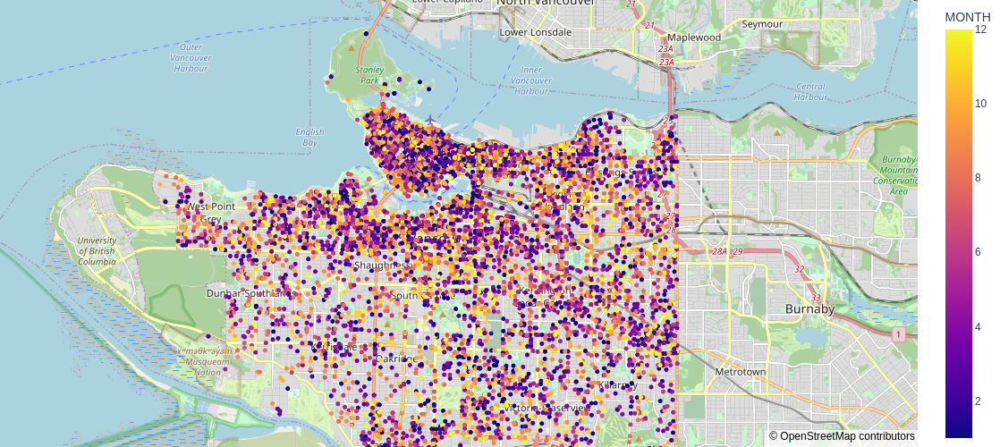

In [22]:
crime = 'Theft from Vehicle'
year = 2020

aux = df0[(df0.TYPE.isin([crime])) & (df0.YEAR.isin([year]))]

fig = px.scatter_mapbox(aux, lat="Lat", lon="Long", hover_name="TYPE", color='MONTH' ,zoom=11, height=500)
fig.update_layout(mapbox_style="open-street-map")
fig.update_layout(margin={"r":0,"t":0,"l":0,"b":0})
fig.show()

In [43]:
m = folium.Map(location=(45.6400, -122.6750), max_zoom=18, zoom_start=11)
m

In [45]:
import utm

In [48]:
utm.to_latlon(x, y, 10, 'N')

(44.95028764419301, -123.64658883706325)

In [ ]:
m = folium.Map(location=(45.7136, -122.6750), )
m

In [62]:
import plotly.express as px
fig = px.density_mapbox(df, lat='Latitude', lon='Longitude', z='Magnitude', radius=10,
                        center=dict(lat=0, lon=180), zoom=0,
                        mapbox_style="stamen-terrain")
fig.show()

FileNotFoundError: [Errno 2] No such file or directory: '.mapbox_token'

In [61]:
import plotly.express as px
df = px.data.carshare()
fig = px.scatter_mapbox(df, lat="centroid_lat", lon="centroid_lon",     color="peak_hour", size="car_hours",
                  color_continuous_scale=px.colors.cyclical.IceFire, size_max=15, zoom=10)
fig.show()